# Explanation analysis for the decision tree model
In this notebook is performed an explanation analysis for the decision tree model, using two approaches: SHAP and LIME.

In [1]:
import shap
import pickle
import pandas as pd
from sklearn.preprocessing import StandardScaler
import lime
from pyDOE2 import lhs
import lime.lime_tabular
from xai_utils import *
from aix360.metrics import faithfulness_metric, monotonicity_metric
from tqdm import tqdm

In [2]:
data = pd.read_csv("../dataset/cleaned_user_profiles.csv", index_col=0)

In [3]:
data.head()

,name,lang,bot,created_at,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
2353593986,Lamonica Raborn,en,1,2019-02-22 18:00:42,76,62.340909,14.015152,0.000000,0.272727,0.098485,0.0,0.0,0.037879,0.190903,0.232481,0.037879,0.190903,0.232481
2358850842,Lourie Botton,en,0,2019-02-26 03:02:32,54,69.082645,15.041322,0.000000,0.338843,0.024793,0.0,0.0,0.049587,0.217090,0.284639,0.024793,0.155495,0.167568
137959629,Dadan Syarifudin,en,1,2015-04-30 07:09:56,53,65.340909,14.694444,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000
466124818,Carletto Focia,it,1,2017-01-18 02:49:18,50,86.944871,18.689463,0.022331,0.006281,0.072575,0.0,0.0,0.165387,0.530838,0.669155,0.826239,13.034008,0.392850
2571493866,MBK Ebook,en,0,2019-06-18 19:30:21,7085,72.311246,14.582073,0.000825,0.506461,0.118229,0.0,0.0,0.056365,0.243387,0.317182,0.016772,0.142619,0.120737


In [4]:
# A description of the dataset
data.describe()

,bot,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
count,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000,11508.000000
mean,0.531456,5148.794751,67.100135,15.045892,0.031045,0.347537,0.101921,0.001967,0.023941,0.084282,0.365569,0.385430,98.347409,361.956697,1.011612
std,0.499031,18496.606420,12.755296,2.454106,0.053379,0.343735,0.093837,0.007796,0.068508,0.109623,0.408441,0.390787,329.248000,626.207734,1.412183
min,0.000000,0.000000,32.500000,9.644166,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000
25%,0.000000,53.000000,59.686796,13.553296,0.000000,0.010260,0.045455,0.000000,0.000000,0.017751,0.136692,0.119116,0.022901,0.151796,0.136059
50%,1.000000,57.000000,65.340909,14.694444,0.005109,0.303797,0.073394,0.000000,0.000000,0.045752,0.230747,0.268594,0.096931,0.437106,0.312150
75%,1.000000,2041.000000,74.254999,16.772205,0.037445,0.500000,0.128810,0.000000,0.000000,0.088862,0.451218,0.491767,74.499524,533.013057,1.462435
max,1.000000,399555.000000,104.449541,22.000000,0.287760,1.726592,0.478261,0.044444,0.333767,0.529903,2.183383,1.723913,14432.000000,5442.443396,9.161105


In [5]:
train_set, test_set, train_label, test_label = prepare_data(data)

Features : ['created_at', 'statuses_count', 'avg_length', 'avg_special_chars', 'urls_ratio', 'mentions_ratio', 'hashtags_ratio', 'reply_count_mean', 'reply_count_std', 'favorite_count_mean', 'favorite_count_std', 'favorite_count_entropy', 'retweet_count_mean', 'retweet_count_std', 'retweet_count_entropy']


In [6]:
features = test_set.columns.to_list() # Creates a list with the name of all the features

## Model loading
Here we load the decision tree model

In [7]:
with open("../models_checkpoints/random_forest_no_lang.bin", "rb") as f:
    dt_model = pickle.load(f)

Trying to unpickle estimator DecisionTreeClassifier from version 1.1.3 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestClassifier from version 1.1.3 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations


In [8]:
dt_model

RandomForestClassifier(ccp_alpha=0.001, max_features='sqrt', min_samples_leaf=3,
                       min_samples_split=4, min_weight_fraction_leaf=0.001,
                       n_estimators=120)

## Explain model

### SHAP

In [9]:
shap.initjs()

#### Global explanation

In [10]:
shap_values_tree = shap.TreeExplainer(dt_model).shap_values(test_set.iloc[0:200])

We can see that for SHAP the **Statuses Count** feature is the most important one.

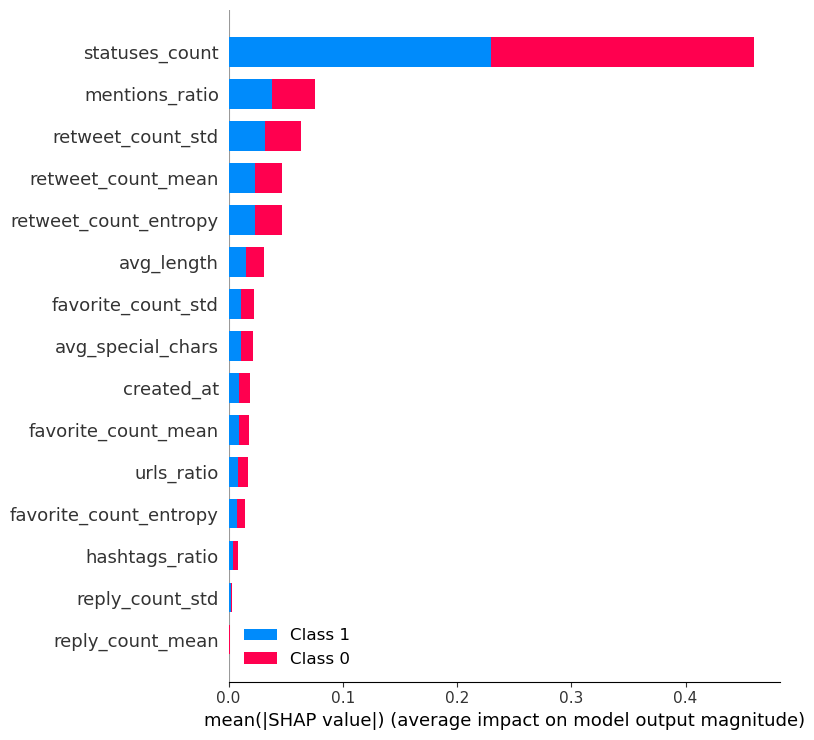

In [11]:
shap.summary_plot(shap_values_tree, test_set.iloc[0:200])

In [12]:
shap_values_tree[0].shape

(200, 15)

We plot the shape value of some instances (first 200) w.r.t. fixed feature, plotted against (color dimension) another one.

Plots the value of the feature on the x-axis and the SHAP value of the same feature on the y-axis. This shows how the model depends on the given feature

We can see that some feature have a kind correlation w.r.t. the shap value 

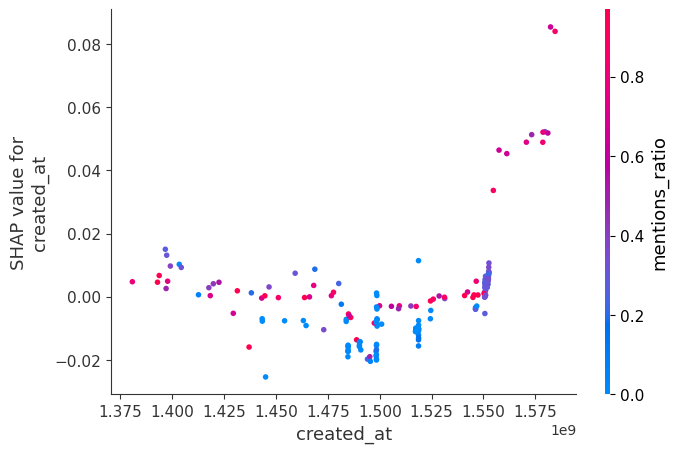

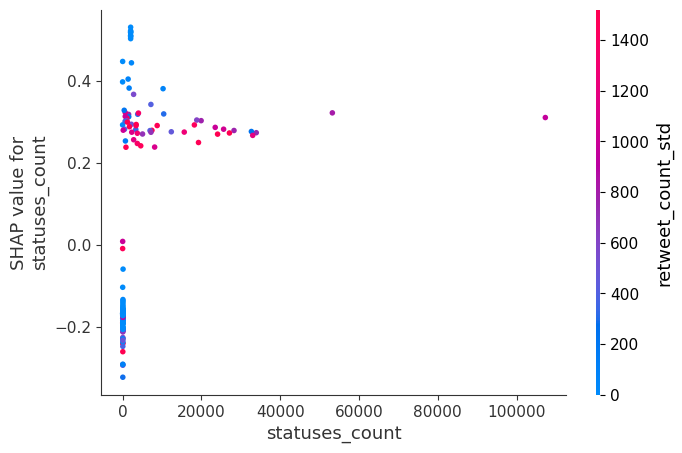

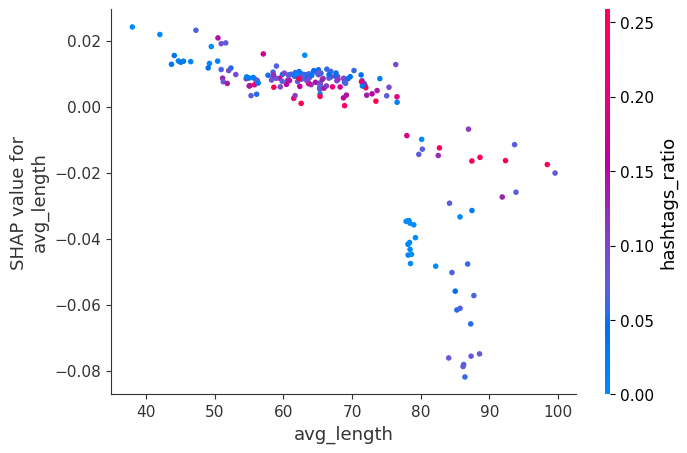

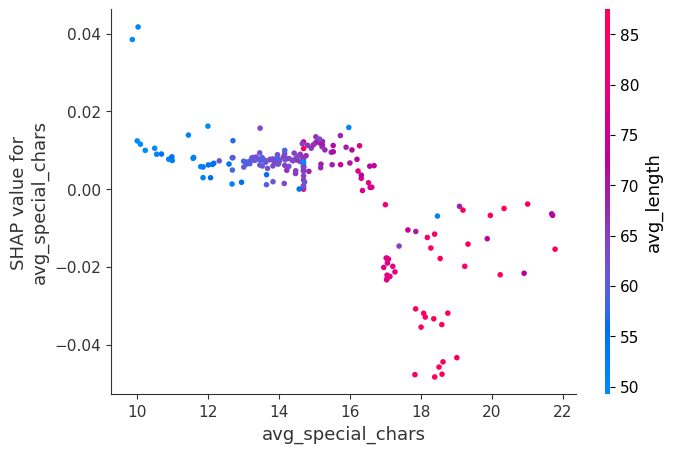

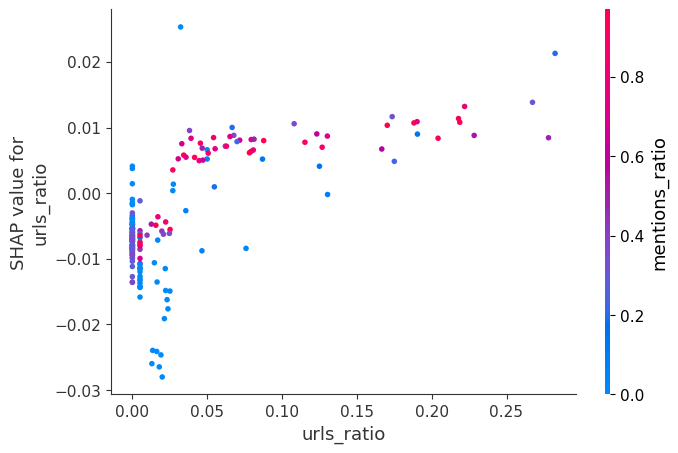

...

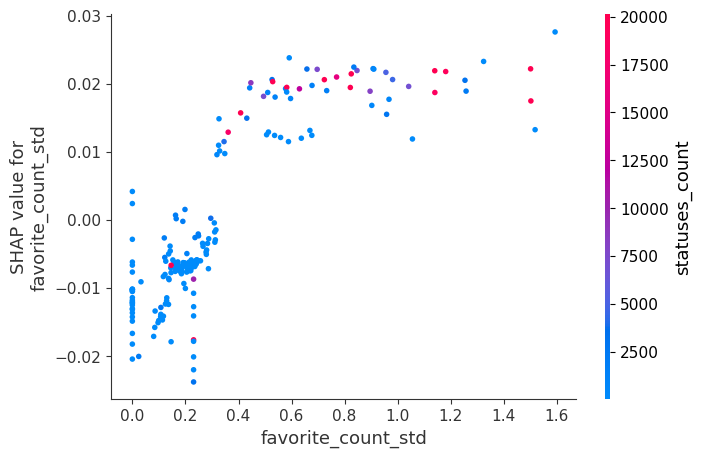

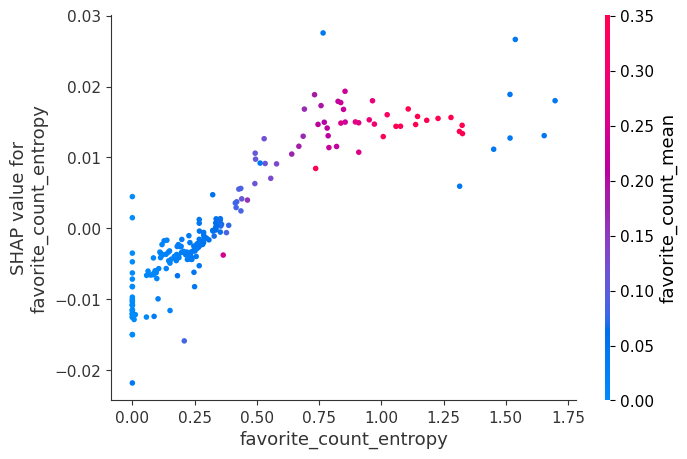

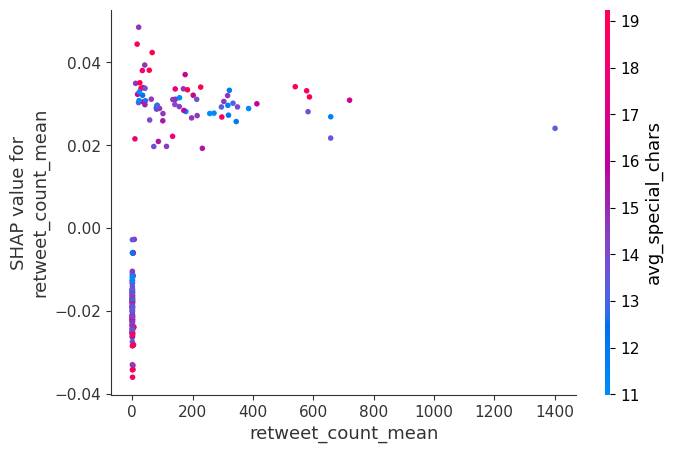

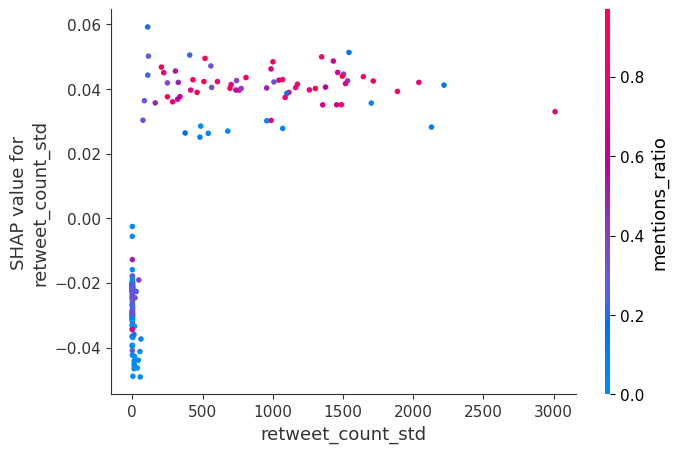

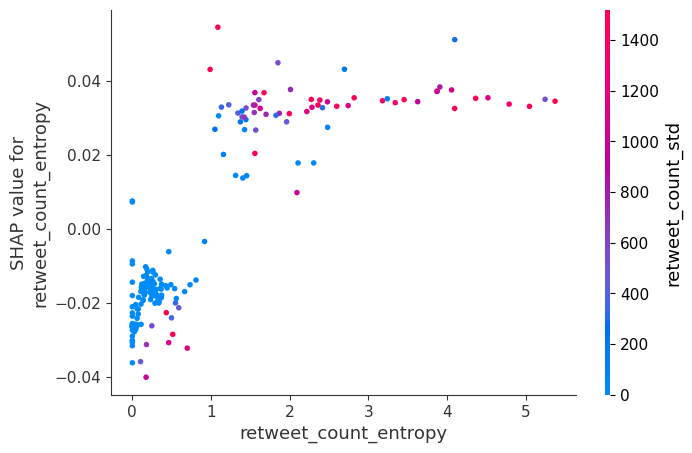

In [13]:
for feat in features:
    shap.dependence_plot(feat, shap_values_tree[0], test_set.iloc[0:200])

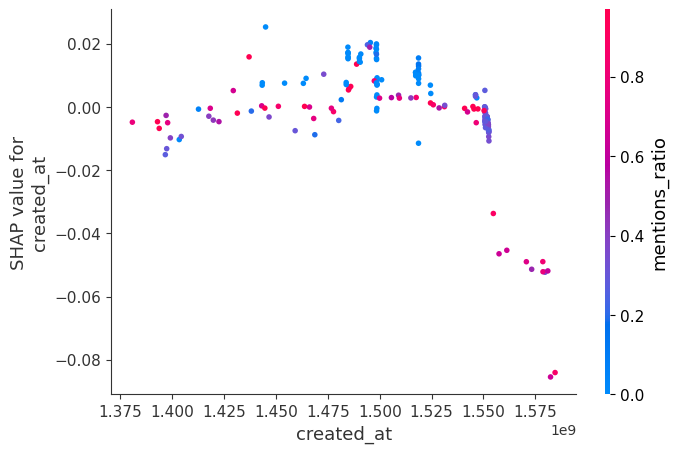

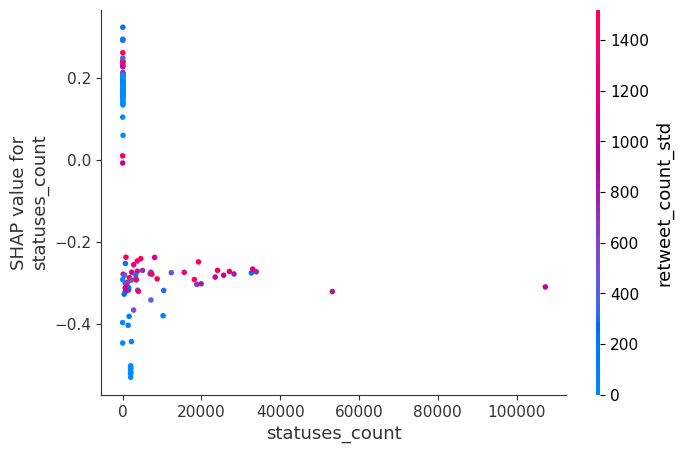

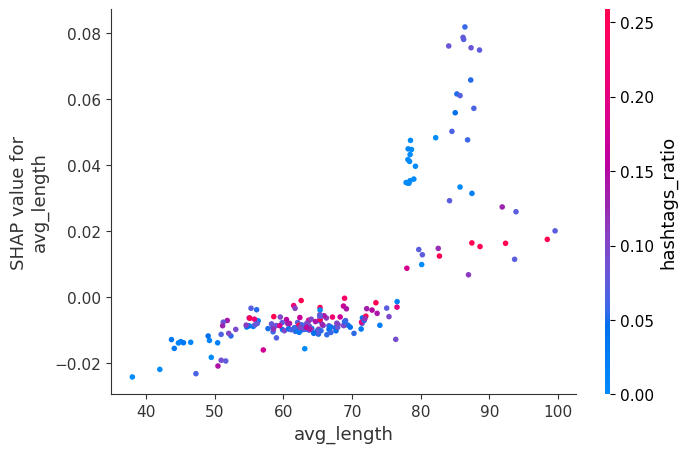

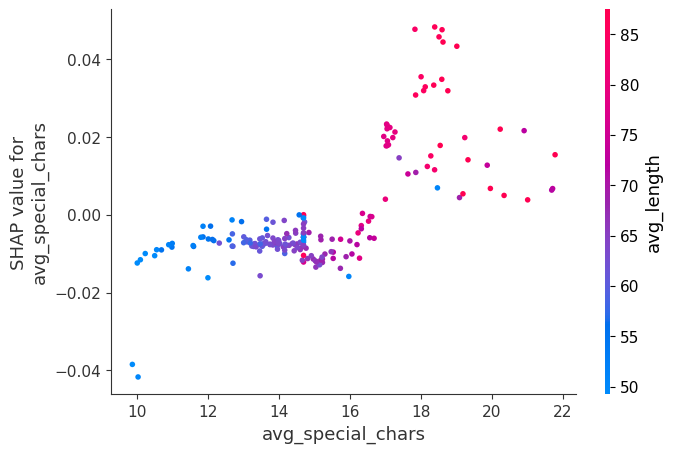

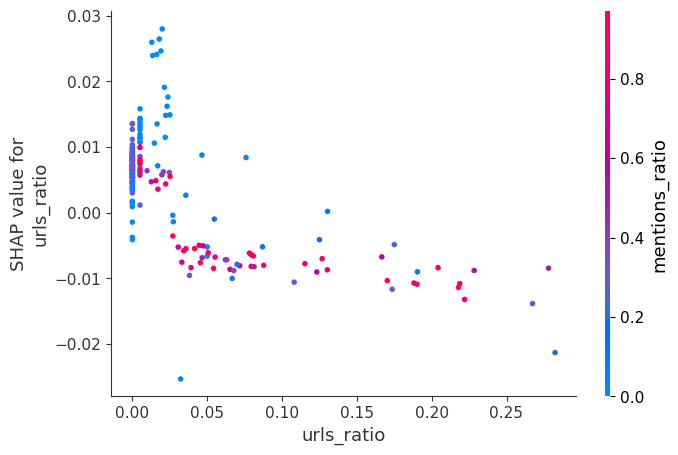

...

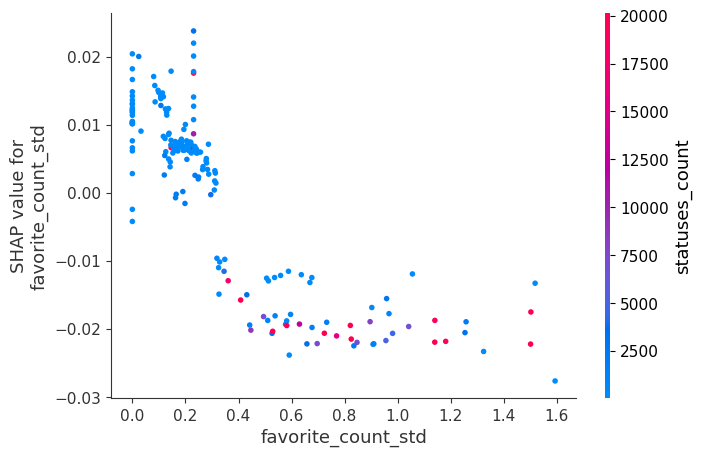

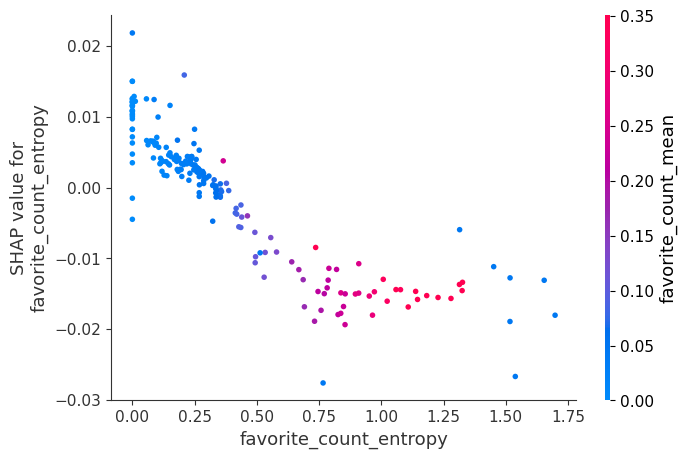

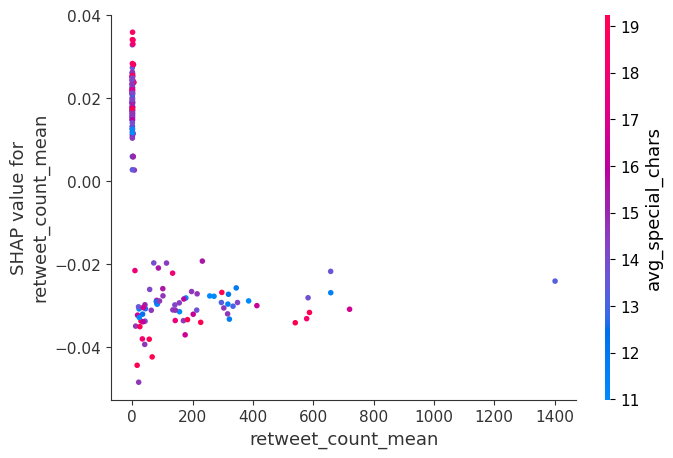

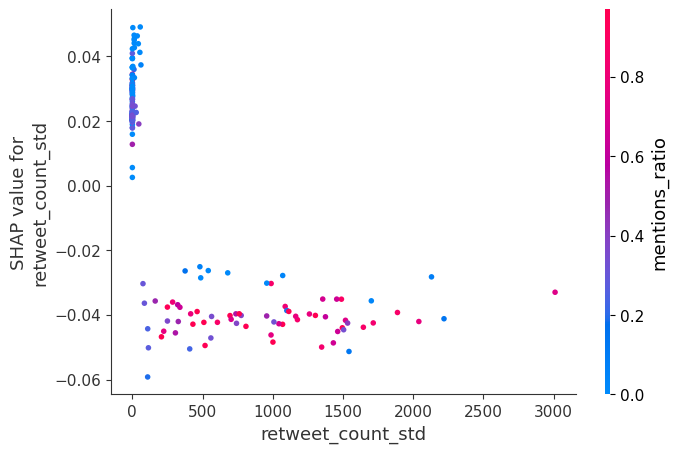

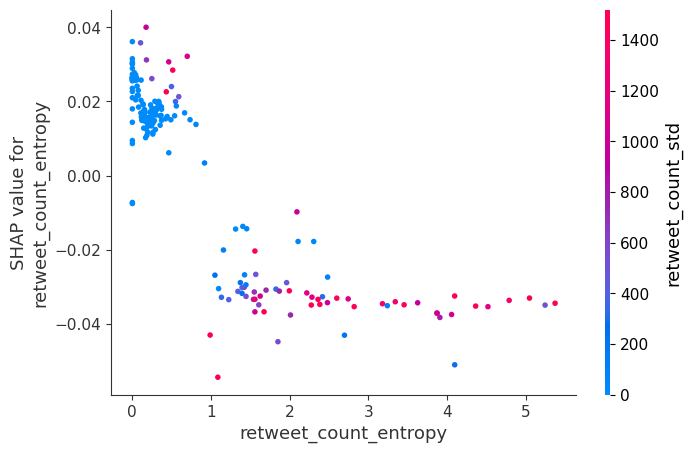

In [14]:
for feat in features:
    shap.dependence_plot(feat, shap_values_tree[1], test_set.iloc[0:200])

In [15]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[0], shap_values_tree[0], test_set.iloc[0:200])

In [16]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[1], shap_values_tree[1], test_set.iloc[0:200])

Estimate the SHAP interaction values for a set of samples

In [17]:
shap_interaction_values_tree = shap.TreeExplainer(dt_model).shap_interaction_values(test_set.iloc[0:200])

In [18]:
len(shap_interaction_values_tree)

2

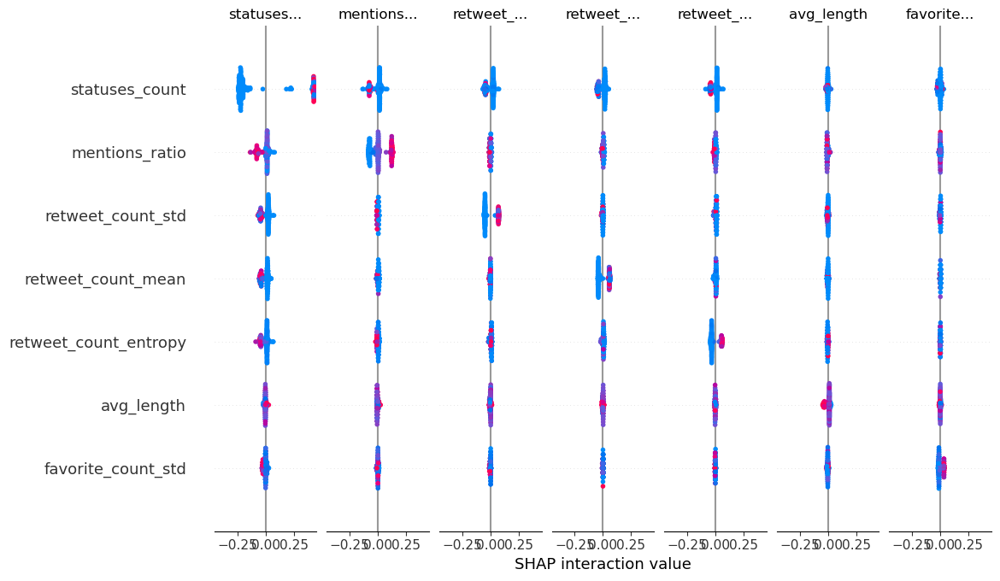

In [19]:
shap.summary_plot(shap_interaction_values_tree[0], test_set.iloc[0:200])

Plot the SHAP interaction values between the features for some samples (first 200)

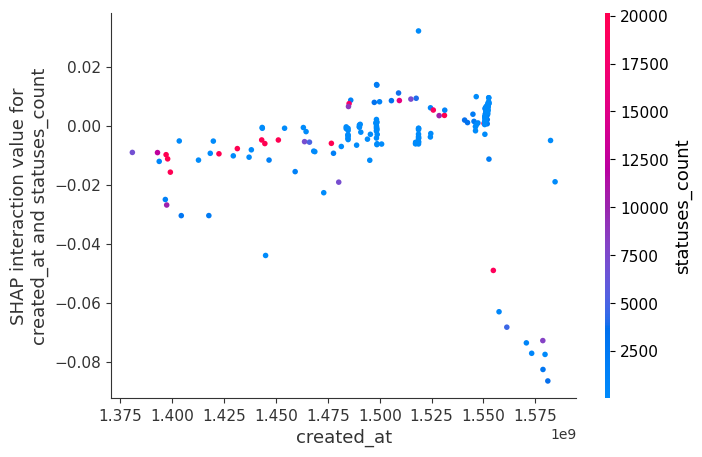

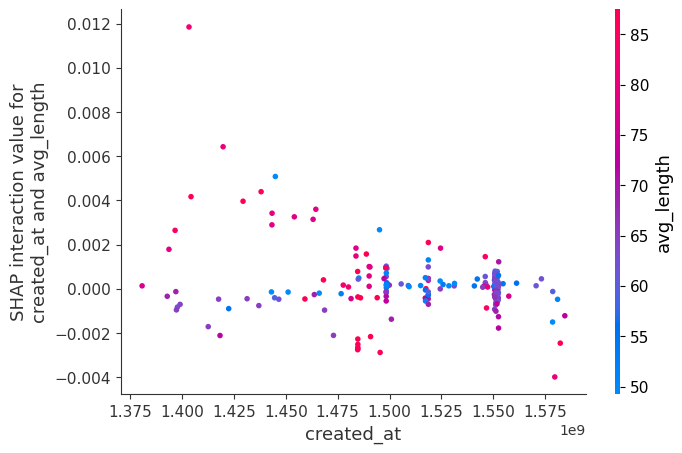

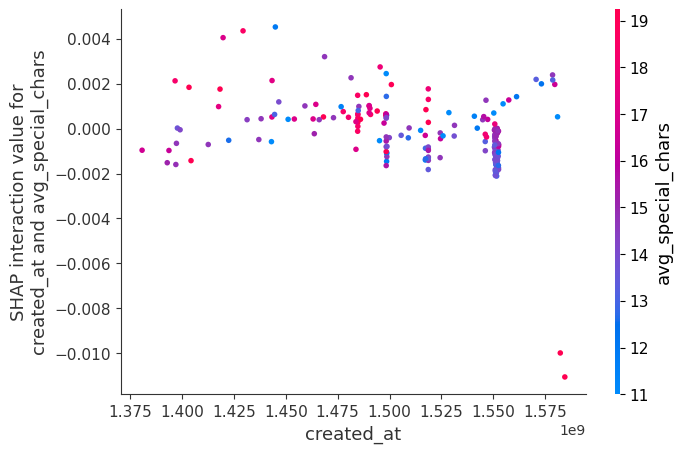

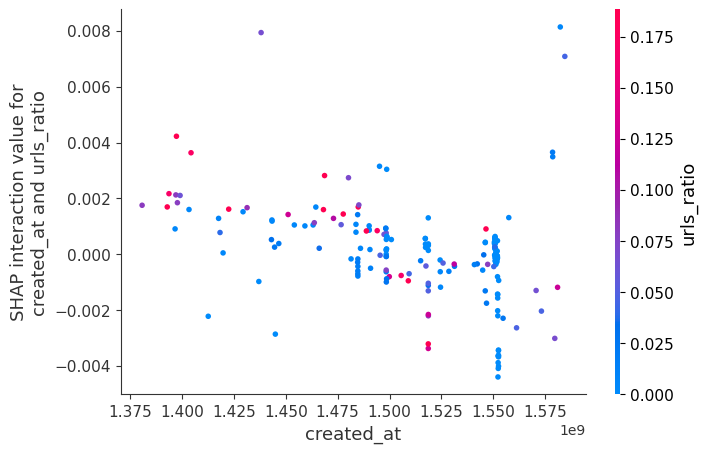

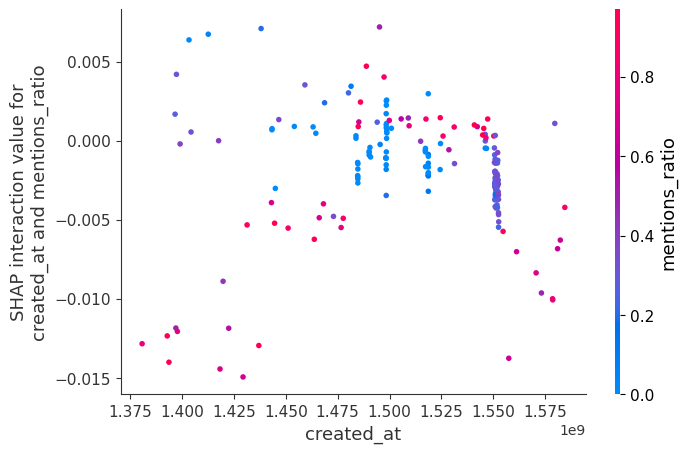

...

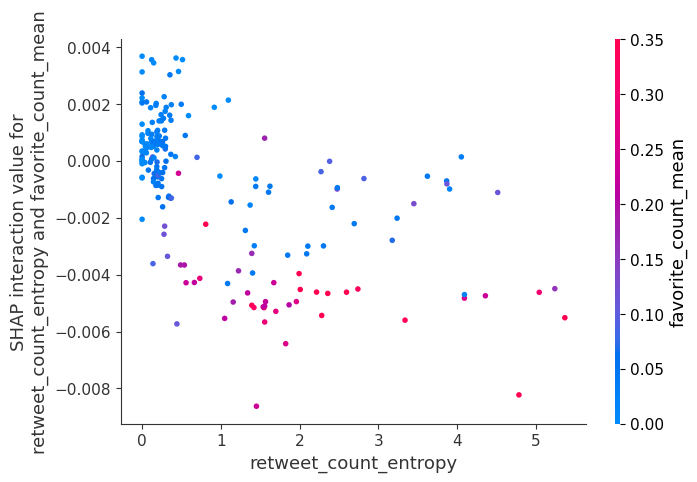

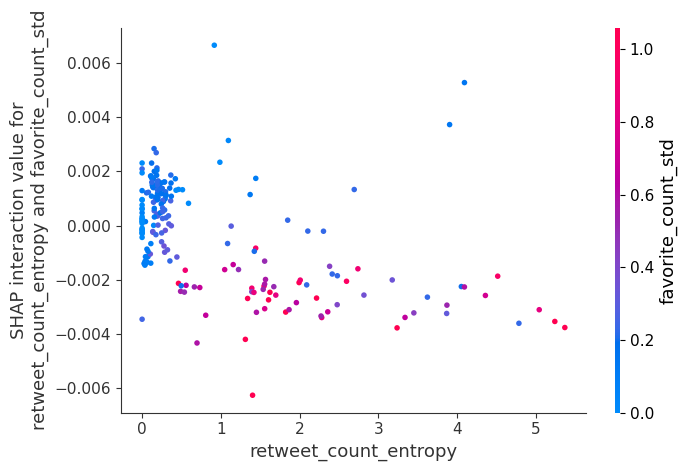

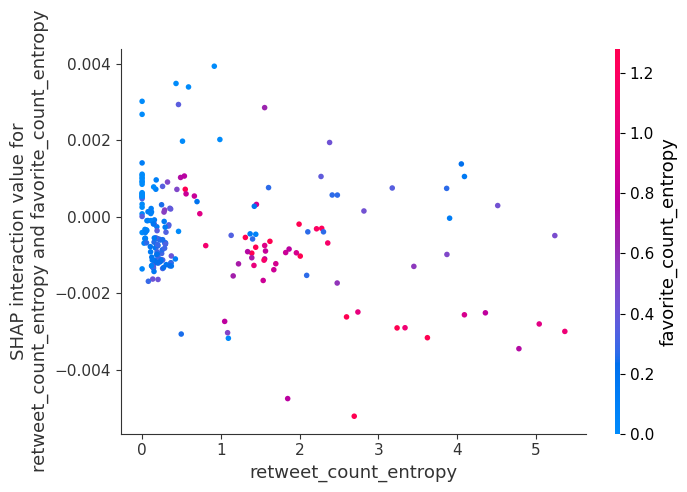

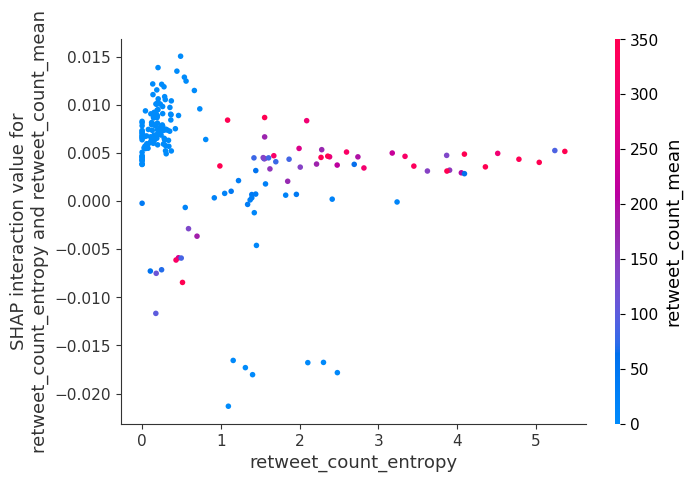

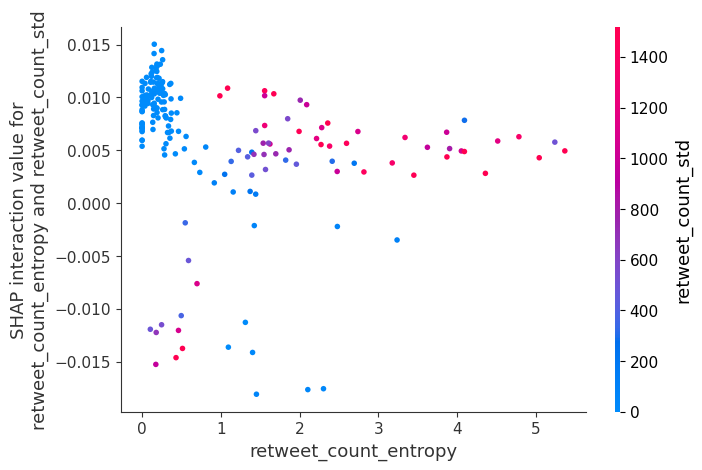

In [20]:
for feat1 in features:
    for feat2 in features:
        if feat1 != feat2:
            shap.dependence_plot(
                (feat1, feat2),
                shap_interaction_values_tree[0], test_set.iloc[0:200]
            )

#### Local explanation

Explanation of the second instance of the test set predicted as 0

In [21]:
test_set.iloc[1]

created_at                1.581027e+09
statuses_count            3.737000e+03
avg_length                5.114919e+01
avg_special_chars         1.089514e+01
urls_ratio                1.232432e-01
mentions_ratio            6.140541e-01
hashtags_ratio            1.275676e-01
reply_count_mean          0.000000e+00
reply_count_std           0.000000e+00
favorite_count_mean       9.297297e-02
favorite_count_std        4.312199e-01
favorite_count_entropy    4.276750e-01
retweet_count_mean        2.708238e+02
retweet_count_std         1.375382e+03
retweet_count_entropy     2.382324e+00
Name: 3018833249, dtype: float64

In [22]:
test_label.iloc[1]

0

In [23]:
dt_model.predict(test_set.values[1].reshape(1, -1))

array([0])

In [24]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[0], shap_values_tree[0][1,:], features)

Explanation of the third instance of the test set predicted as 1

In [25]:
test_set.iloc[2]

created_at                1.550770e+09
statuses_count            7.600000e+01
avg_length                6.758621e+01
avg_special_chars         1.476552e+01
urls_ratio                0.000000e+00
mentions_ratio            2.896552e-01
hashtags_ratio            4.827586e-02
reply_count_mean          0.000000e+00
reply_count_std           0.000000e+00
favorite_count_mean       5.517241e-02
favorite_count_std        2.567519e-01
favorite_count_entropy    3.075908e-01
retweet_count_mean        4.137931e-02
retweet_count_std         1.991659e-01
retweet_count_entropy     2.485809e-01
Name: 2352015044, dtype: float64

In [26]:
test_label.iloc[2]

1

In [27]:
dt_model.predict(test_set.values[2].reshape(1, -1))

array([1])

In [28]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[1], shap_values_tree[1][2,:], features)

### LIME

In [29]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(train_set.values, feature_names = features)

In [30]:
dt_model.predict(test_set.values)

array([1, 0, 1, ..., 1, 1, 0])

#### Local explanation

Explanation of the first instance of the test set predicted as 1

In [31]:
exp = lime_explainer.explain_instance(test_set.values[0], dt_model.predict_proba, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

Explanation of the second instance of the test set predicted as 0

In [32]:
exp = lime_explainer.explain_instance(test_set.values[1], dt_model.predict_proba, top_labels=0)
exp.show_in_notebook(show_table=True, show_all=True)

We can see that the most important feature for LIME is **Statuses Count** as for SHAP

## Evaluation

We will print two indicator for the XAI methods.
- **Faithfulness:** evaluates the correlation between the importance assigned by the interpretability algorithm to attributes and the effect of each of the attributes on the performance of the predictive model. The metric evaluates this by incrementally removing each of the attributes deemed important by the interpretability metric, and evaluating the effect on the performance, and then calculating the correlation between the weights (importance) of the attributes and corresponding model performance. Higher is Better.
- **Monotonicity:** measures the effect of individual features on model performance by evaluating the effect on model performance of incrementally adding each attribute in order of increasing importance. As each feature is added, the performance of the model should correspondingly increase, thereby resulting in monotonically increasing model performance.

### LIME

In [33]:
predicted_class = dt_model.predict(test_set.values[0].reshape(1,-1))[0]

le = exp.local_exp[predicted_class]

m = exp.as_map()

x = test_set.values[0]
coefs = np.zeros(x.shape[0])

for v in le:
    coefs[v[0]] = v[1]


base = np.zeros(x.shape[0])


print("Faithfulness: ", faithfulness_metric(dt_model, x, coefs, base))
print("Monotonity: ", monotonicity_metric(dt_model, x, coefs, base))

Faithfulness:  -0.97018030813724
Monotonity:  False


In [34]:
ncases = 100
fait = np.zeros(ncases)
monotons = []
for i in tqdm(range(ncases)):
    predicted_class = dt_model.predict(test_set.values[i].reshape(1,-1))[0]
    exp = lime_explainer.explain_instance(test_set.values[i], dt_model.predict_proba, top_labels=1)
    le = exp.local_exp[predicted_class]
    m = exp.as_map()
    
    x = test_set.values[i]
    coefs = np.zeros(x.shape[0])
    
    for v in le:
        coefs[v[0]] = v[1]
    fait[i] = faithfulness_metric(dt_model, test_set.values[i], coefs, base)
    
    monotons.append(monotonicity_metric(dt_model, test_set.values[i], coefs, base))
    
fait[np.isnan(fait)] = 0

100%|█████████████████████████████████████████| 100/100 [00:28<00:00,  3.54it/s]


In [35]:
print("Faithfulness metric mean: ",np.mean(fait))
print("Faithfulness metric std. dev.:", np.std(fait))
print(f"Ratio of monotonicity : {np.sum(monotons)}/{ncases}")

Faithfulness metric mean:  0.5945794122557264
Faithfulness metric std. dev.: 0.7263502042683694
Ratio of monotonicity : 2/100


### SHAP

In [36]:
predicted_class = dt_model.predict([test_set.values[0]])[0]
x = test_set.values[0]
coefs = np.zeros(x.shape[0])
print("Faithfulness: ", faithfulness_metric(dt_model, x, shap_values_tree[predicted_class][0], base))
print("Monotonity: ", monotonicity_metric(dt_model, x, shap_values_tree[predicted_class][0], base))

Faithfulness:  0.9497747722400307
Monotonity:  False


In [37]:
ncases = 100
fait = np.zeros(ncases)
monotons = []
for i in tqdm(range(ncases)):
    predicted_class = dt_model.predict(test_set.values[i].reshape(1,-1))[0]
    fait[i] = faithfulness_metric(dt_model, test_set.values[i], shap_values_tree[predicted_class][i], base)

    monotons.append(monotonicity_metric(dt_model, test_set.values[i], shap_values_tree[predicted_class][i], base))
    
fait[np.isnan(fait)] = 0

100%|█████████████████████████████████████████| 100/100 [00:17<00:00,  5.83it/s]


In [38]:
print("Faithfulness metric mean: ",np.mean(fait))
print("Faithfulness metric std. dev.:", np.std(fait))
print(f"Ratio of monotonicity : {np.sum(monotons)}/{ncases}")

Faithfulness metric mean:  0.9191009397136134
Faithfulness metric std. dev.: 0.14721774365879206
Ratio of monotonicity : 1/100
